# Exercício 37
Usar a STFT (quando possível) para analisar os sons de alguns sinais reais
mencionados na Seção 5.3: a) fala; b) voz de cetáceo; c) som de hélice; d) resposta a
irradiação por pulso de sonar; e) som de limpador de para-brisa; f) som de batida de porta;
g) operação de máquina em funcionamento / em falha; h) operação de broca nova / gasta
i) som de trompete; j) som de coração.

## Resolução:
O trabalho será realizado em python, em um notebook jupyter disponível a seguir, que pode ser acessado interativamente em [https://pedrohlopes.github.io/ex37.html](https://pedrohlopes.github.io/ex37.html). A STFT será realizada pela implementação da biblioteca librosa, junto com as funções para plotar os espectrogramas. Para facilitar a visualização, após a geração das STFT's para cada sinal, mostraremos os respectivos espectrogramas de potência em escala logarítimica (dB).

Começamos por importar as bibliotecas necessárias:

In [1]:
import warnings
warnings.filterwarnings('ignore')
from librosa import stft 
import librosa.display
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
plt.rcParams["figure.figsize"] = (14,8)
plt.plot()
plt.close()
plt.show()

Agora definimos as funções para ler os arquivos de áudio e fazer o plot dos espectrogramas. As STFT's operam com tamanho de janela 2048 e salto de 512 amostras. Os outros parâmetros (formato da janela, padding, etc) são os padrões da biblioteca.

In [2]:
def get_spectrogram_data(signal,samplerate,n_fft=2048, hop_length=512,start=0,end=10):
    X = stft(signal[int(start*samplerate):int(end*samplerate)],n_fft=n_fft, hop_length=hop_length,win_length=n_fft)
    X_db = librosa.amplitude_to_db(np.abs(X), ref=np.max)
    return X_db

def play_audio(signal,samplerate,start=0,end=10):
    Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

def plot_spectrogram(signal, samplerate,n_fft=2048, hop_length=512,start=0,end=10,y_axis='linear'):
    X_db = get_spectrogram_data(signal,samplerate,n_fft=n_fft, hop_length=hop_length,start=start,end=end)
    fig, ax = plt.subplots()
   
    img = librosa.display.specshow(X_db, sr=samplerate, x_axis='time', y_axis=y_axis, ax=ax)
    ax.set_title('Espectrograma de potência, escala log (dB)')
    fig.colorbar(img, ax=ax, format="%+2.0f dB")
    ax.set_xlabel("Tempo (s)")
    ax.set_ylabel("Frequência (Hz)")
    plt.show()

a) Começando pelo sinal de fala, temos:

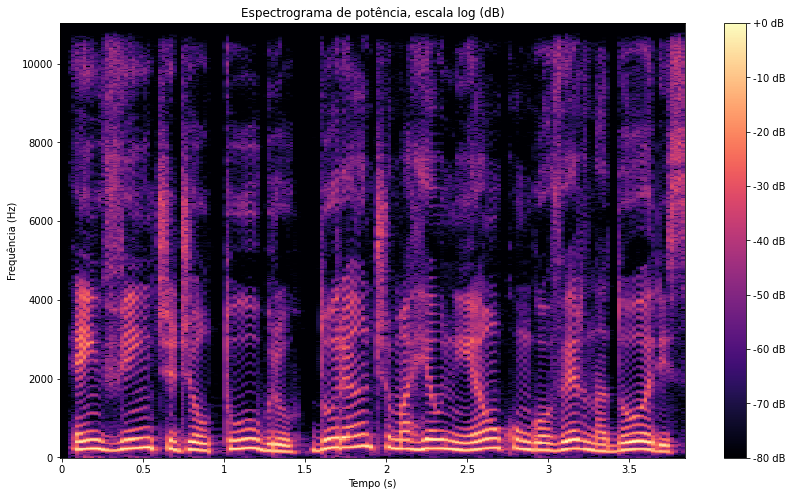

In [12]:
signal,samplerate = sf.read('sinais/fala.wav')
s_8 = librosa.resample(signal,orig_sr=samplerate,target_sr=22050)
start = 0.4
end= 4.25
plot_spectrogram(s_8,22050,start=start,end=end,hop_length=512,n_fft=1024)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

b) Para os cetáceos, os sinais foram obtidos na página [http://www-9.unipv.it/cibra/edu_medsounds_uk.html](http://www-9.unipv.it/cibra/edu_medsounds_uk.html). Lá, podemos obter quatro classes de sons produzidos por estes tipos de animais:
- Os sons de baixa frequência (por volta de 20 Hz);
- Os cliques que as baleias cachalotes emitem com um ritmo de 1-4 por segundo enquanto mergulham; 
- Os assobios de alta frequência modulados (variando em frequência para mais de 20 kHz);
- e os cliques de ecolocalização emitidos pelos golfinhos pequenos;

Para cada um deles, trazemos um exemplo. 

Começando pelos sons de baixa frequência, mostramos estes em escala logarítimica de frequência (para melhor visualização) e acelerados em 8x (para possibilitar a audição):

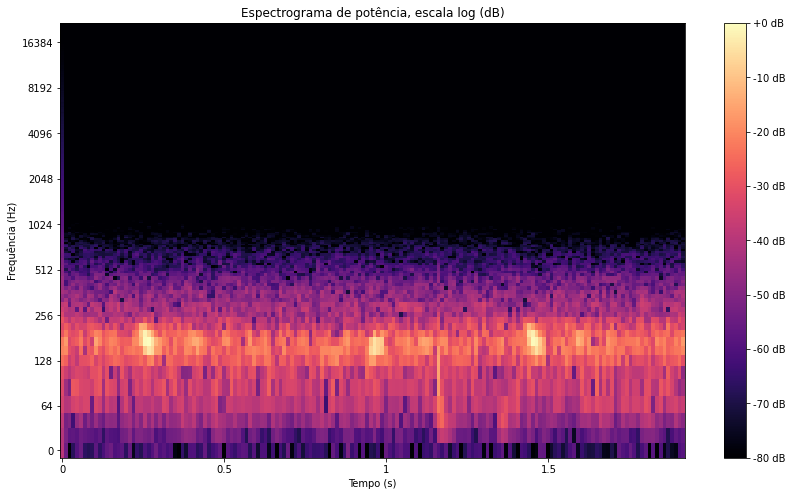

In [4]:
signal,samplerate = sf.read('sinais/low_freq.wav')
start = 0.4
end= 4.25
plot_spectrogram(signal,samplerate,start=start,end=end,y_axis='log', hop_length=1024, n_fft=2048)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

Agora os cliques das cachalotes:


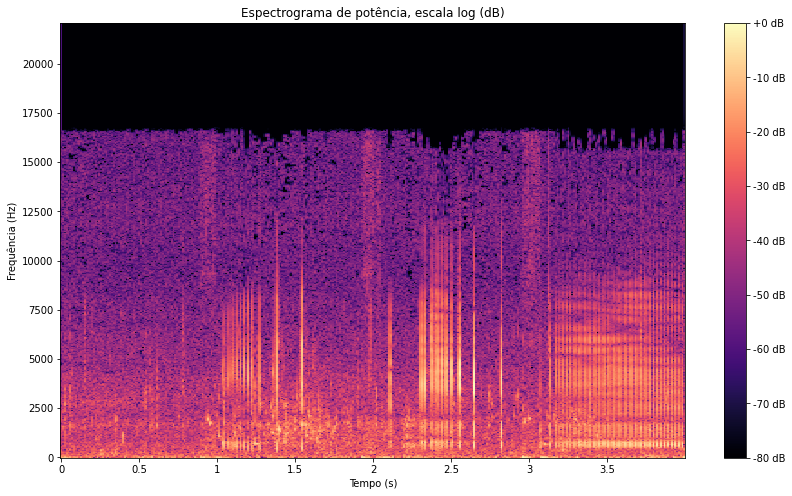

In [5]:
signal,samplerate = sf.read('sinais/cachalotes_cliques.mp3')
signal = signal[:,0]
start = 3
end= 7
plot_spectrogram(signal,samplerate,start=start,end=end,hop_length=512,n_fft=1024)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

Assobios agudos:

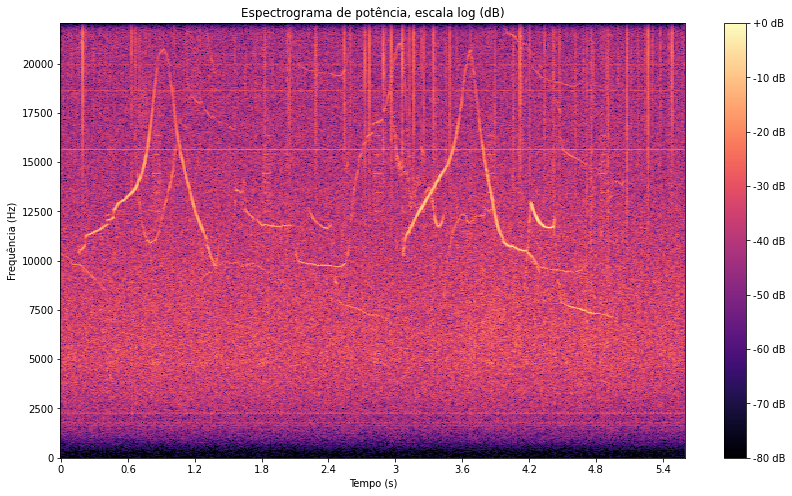

In [6]:
signal,samplerate = sf.read('sinais/assobios.wav')
start = 0.4
end= 6
plot_spectrogram(signal,samplerate,start=start,end=end)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

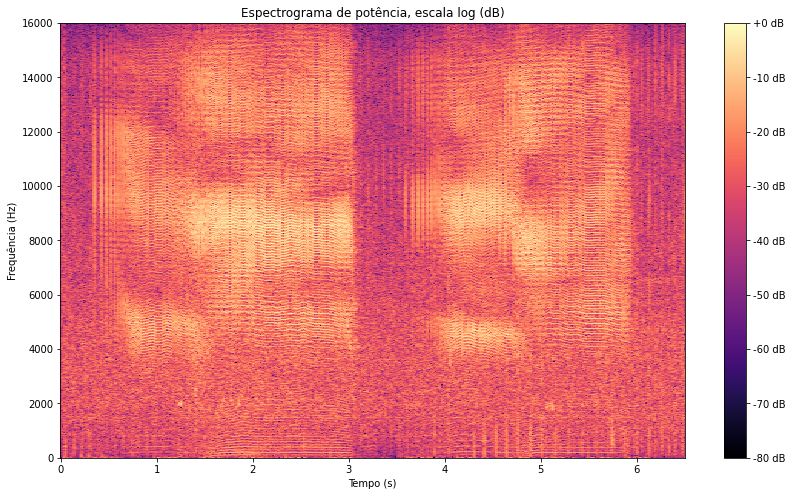

In [7]:
signal,samplerate = sf.read('sinais/ecolocalizacao.wav')
start = 0
end= 10
plot_spectrogram(signal,samplerate,start=start,end=end)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

Trazendo também o exemplo do livro, o som da "Bowhead Whale":

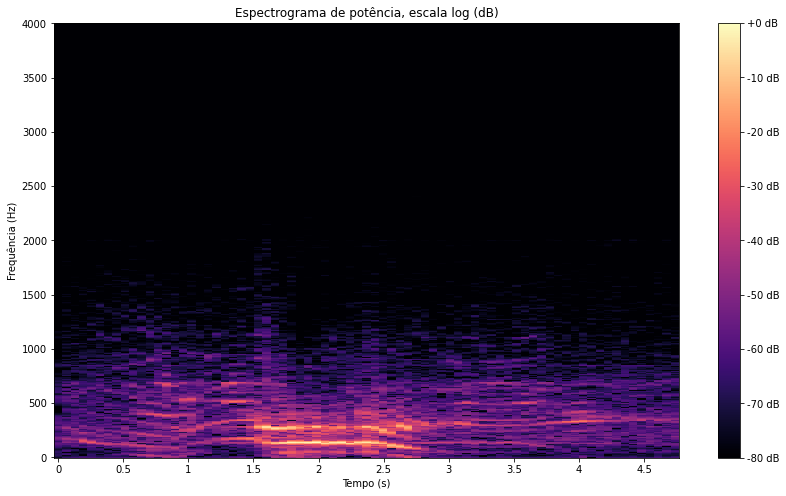

In [8]:
signal,samplerate = sf.read('sinais/bowhead-whale.mp3')
signal = signal[:,0]
s_8 = librosa.resample(signal,orig_sr=samplerate,target_sr=8000)
start = 0
end= 10
plot_spectrogram(s_8,8000,start=start,end=end,hop_length=512,n_fft=1024)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

c) Para o som de hélice, trazemos o som de um motor de avião, encontrado no [pixabay](https://pixabay.com/sound-effects/):

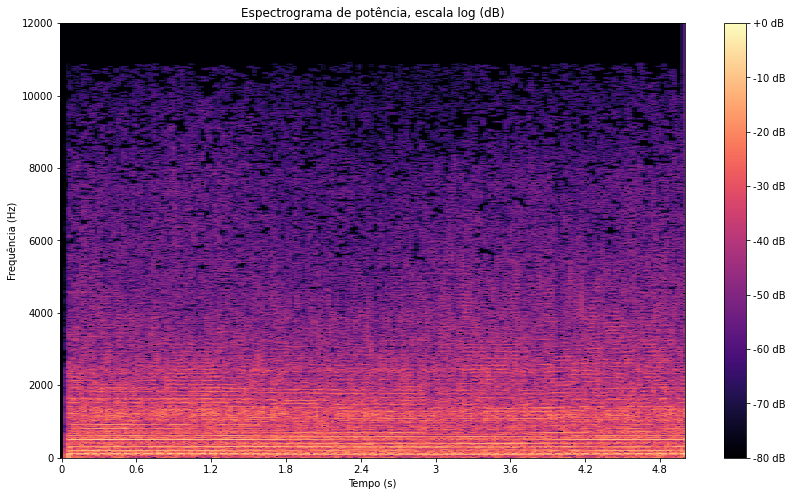

In [39]:
signal,samplerate = sf.read('sinais/helice.mp3')
signal = signal[:,0]
start = 0
end= 5
plot_spectrogram(signal,samplerate,start=start,end=end)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

d) resposta a
irradiação por pulso de sonar, retirada de [https://www.youtube.com/watch?v=BIG7aQM83kI](https://www.youtube.com/watch?v=BIG7aQM83kI)

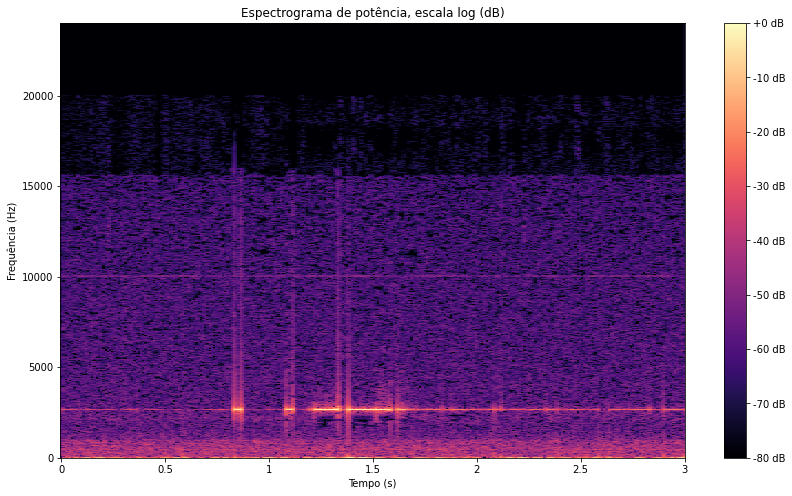

In [22]:
signal,samplerate = sf.read('sinais/sonar.mp3')
signal = signal[:,0]
start = 19
end= 22
plot_spectrogram(signal,samplerate,start=start,end=end)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

e) Para o som de limpador de parabrisa, também trazemos um exemplo encontrado no [pixabay](https://pixabay.com/sound-effects/):


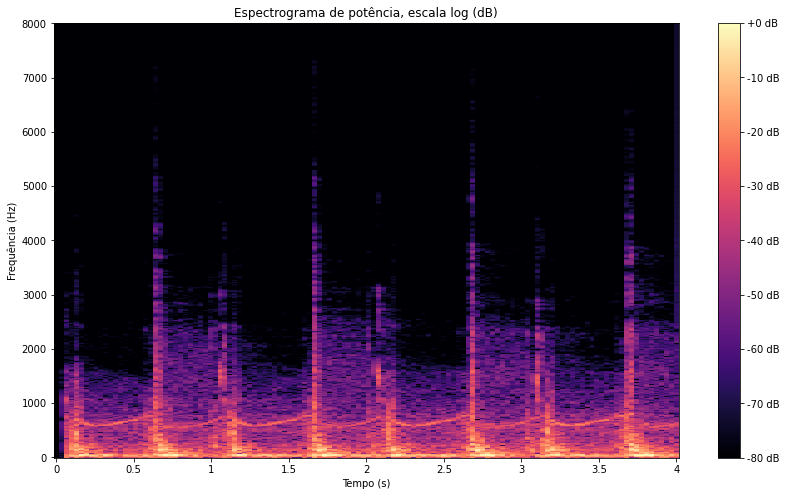

In [10]:
signal,samplerate = sf.read('sinais/para-brisas.mp3')
s_8 = librosa.resample(signal,orig_sr=samplerate,target_sr=16000)
start = 0
end= 4
plot_spectrogram(s_8,16000,start=start,end=end,hop_length=512,n_fft=1024)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

f) Também do [pixabay](https://pixabay.com/sound-effects/), porta batendo:

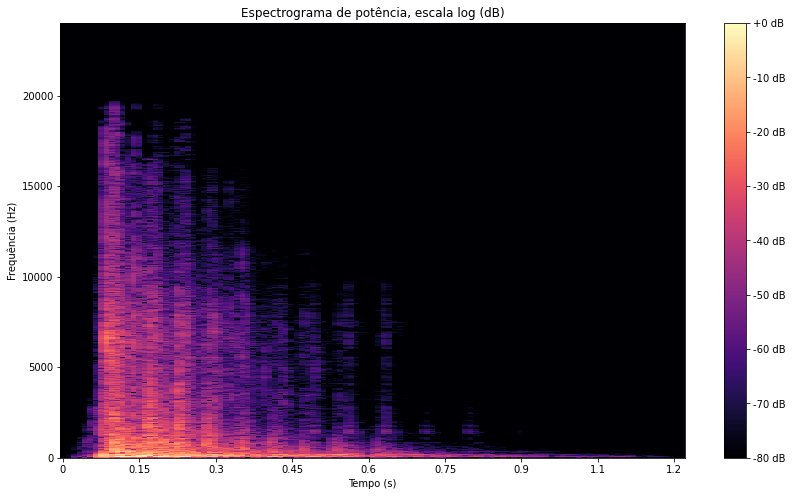

In [11]:
signal,samplerate = sf.read('sinais/door-slam.mp3')
signal = signal[:,0]
start = 0
end= 5
plot_spectrogram(signal,samplerate,start=start,end=end)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

h) operação de broca nova / gasta. Começando pela broca nova, obtida em [https://www.youtube.com/watch?v=C0_M9rcWmY4](https://www.youtube.com/watch?v=C0_M9rcWmY4):

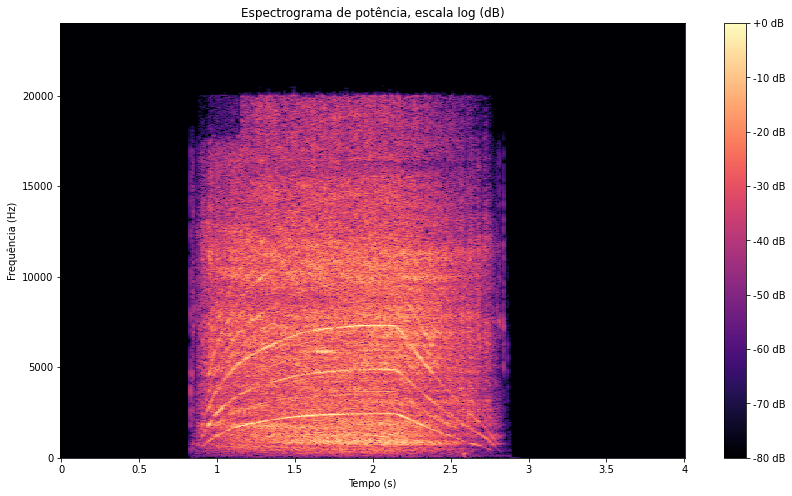

In [27]:
signal,samplerate = sf.read('sinais/broca-nova.mp3')
signal = signal[:,0]
start = 14
end= 18
plot_spectrogram(signal,samplerate,start=start,end=end)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

Broca gasta, obtida em [https://youtu.be/0YflqwZgGls?si=8pGw1HwPp68w8G0e](https://youtu.be/0YflqwZgGls?si=8pGw1HwPp68w8G0e):

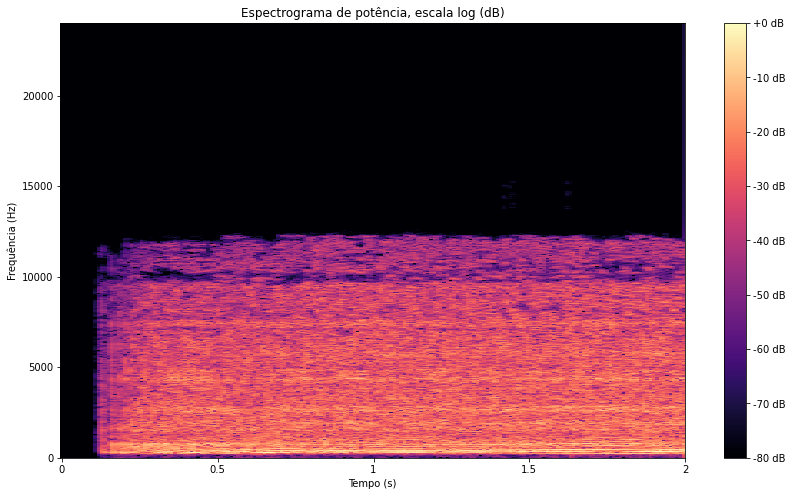

In [38]:
signal,samplerate = sf.read('sinais/broca-velha.mp3')
signal = signal[:,0]
start = 15
end= 17
plot_spectrogram(signal,samplerate,start=start,end=end)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

i) som de trompete, obtido em [https://freesfx.co.uk/sfx/trumpet](https://freesfx.co.uk/sfx/trumpet):

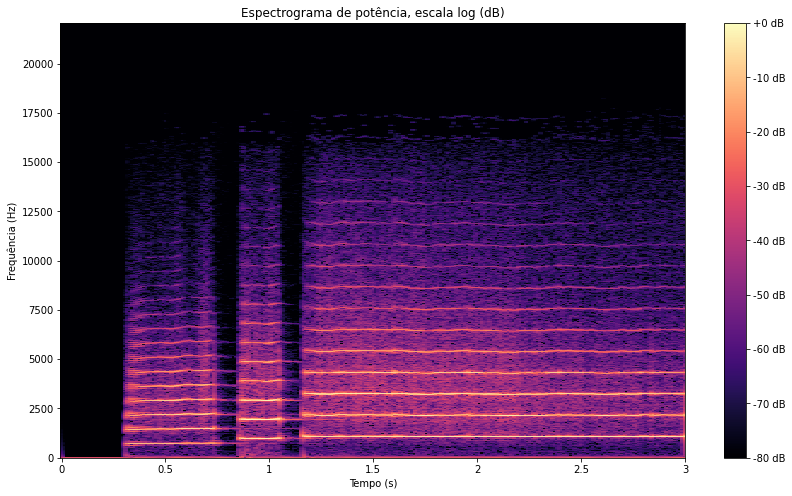

In [12]:
signal,samplerate = sf.read('sinais/trumpet2.mp3')
signal = signal[:,0]
start = 0
end= 3
plot_spectrogram(signal,samplerate,start=start,end=end)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)

j) som de coração ([pixabay](https://pixabay.com/sound-effects/))

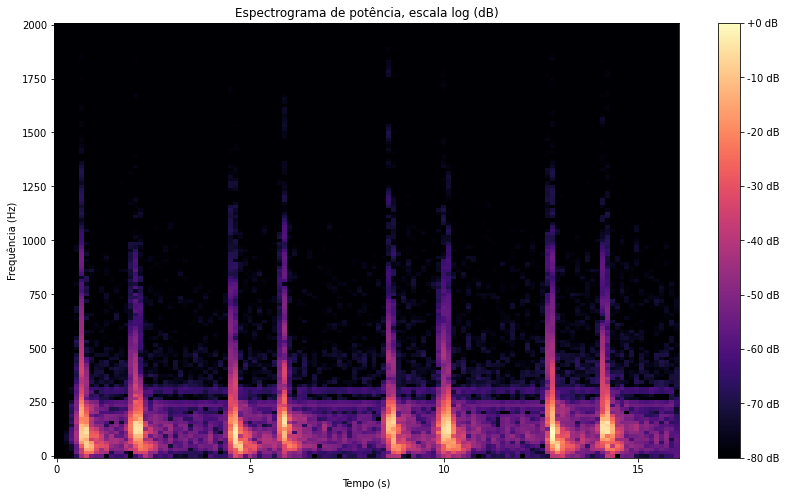

In [13]:
signal,samplerate = sf.read('sinais/heart_beat.mp3')
signal = signal[:,0]
s_8 = librosa.resample(signal,orig_sr=samplerate,target_sr=4000)
start = 0
end= 4
plot_spectrogram(s_8,4000,start=start,end=end,hop_length=128,n_fft=256)
Audio(data=signal[int(start*samplerate):int(end*samplerate)], rate=samplerate)